# Multi-Head Attention Visualized

In [ ]:
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show

sentence_a = "The artist painted the portrait of a woman with a brush"

model_type = 'bert'
model_version = 'bert-base-uncased'
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=True)
show(model, model_type, tokenizer, sentence_a, layer=4, head=3)

100%|██████████| 231508/231508 [00:00<00:00, 3305616.50B/s]


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


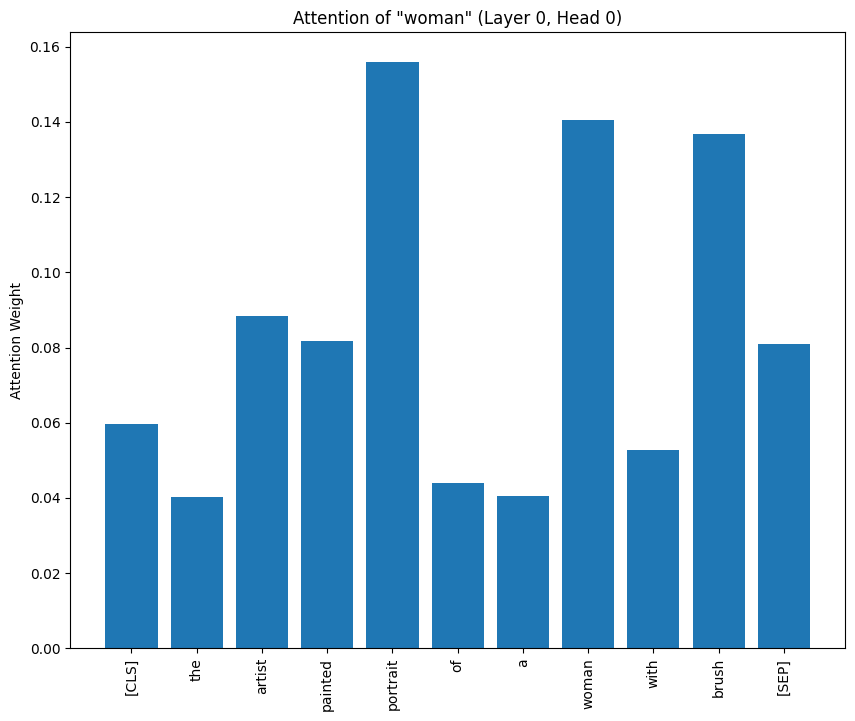

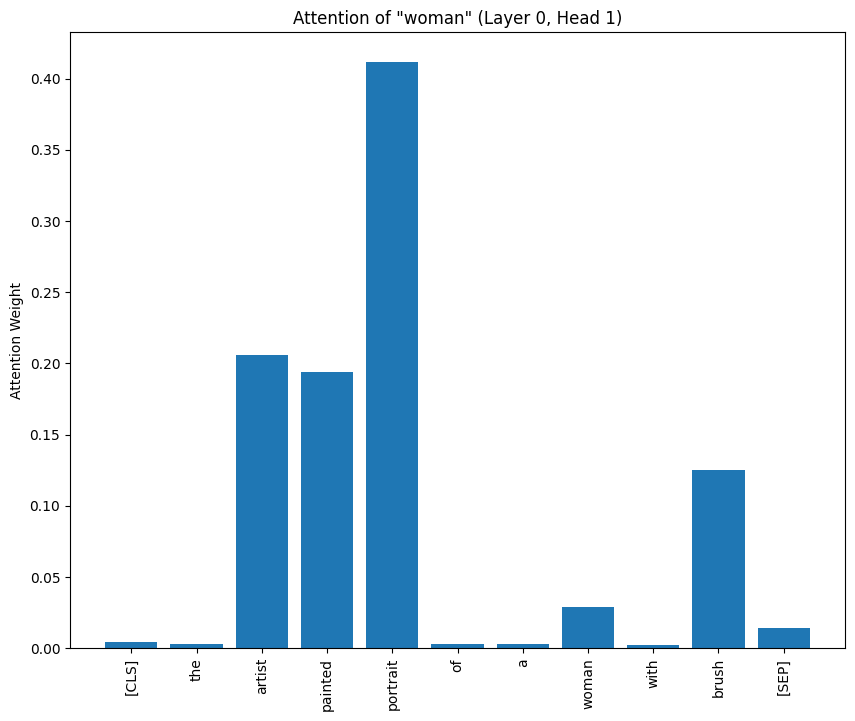

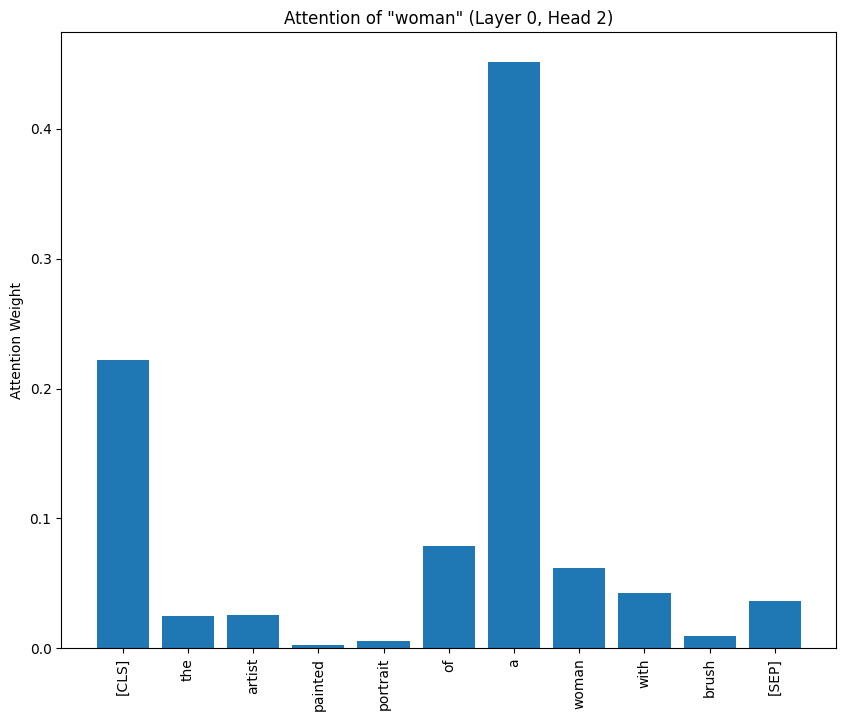

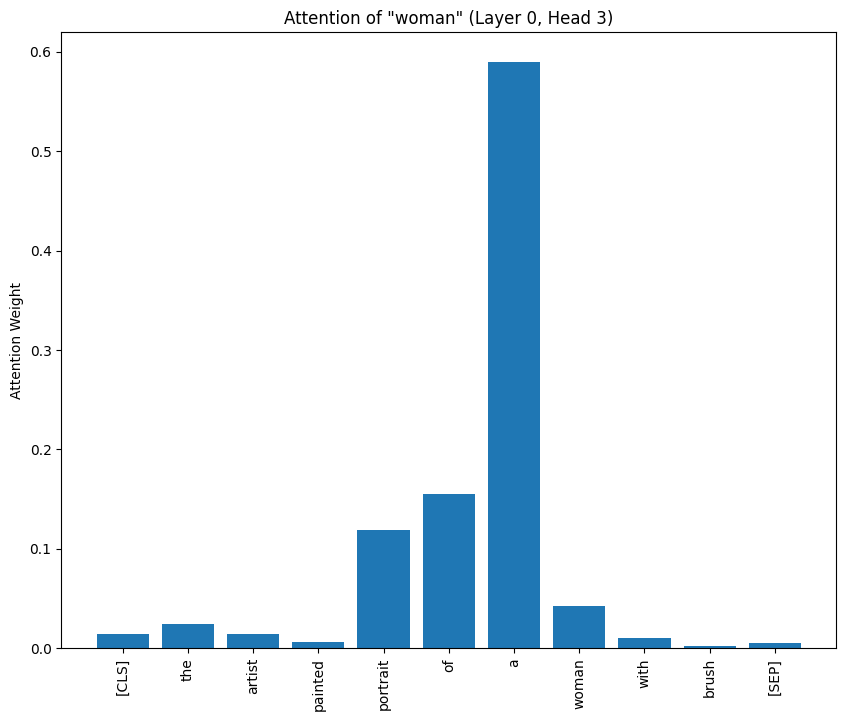

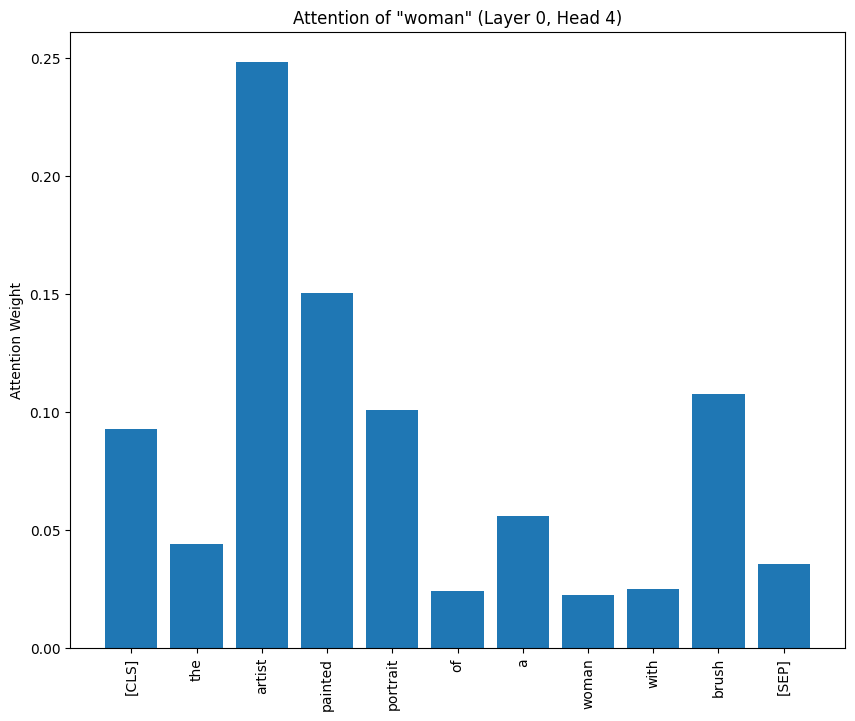

...

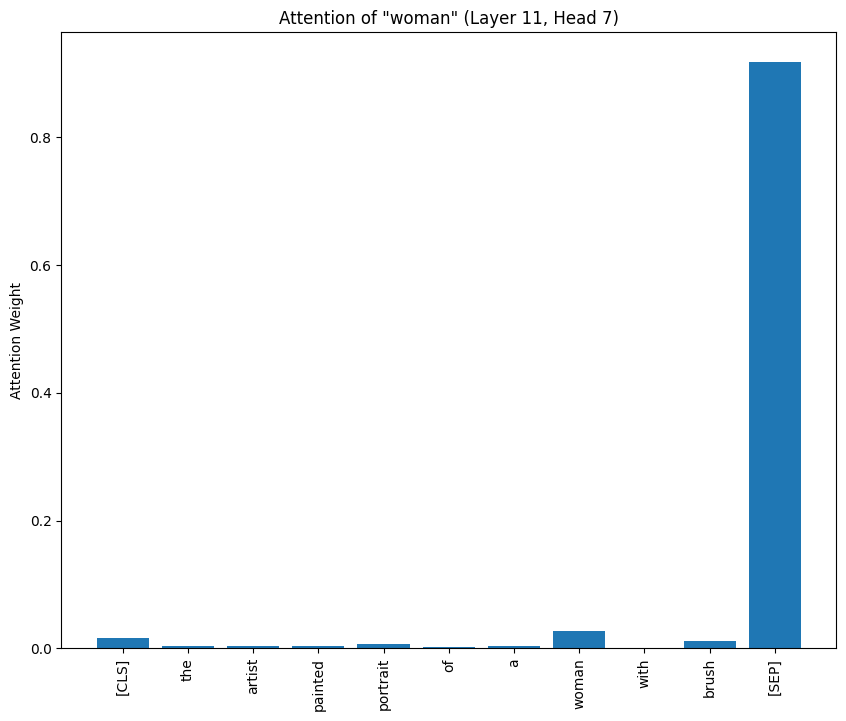

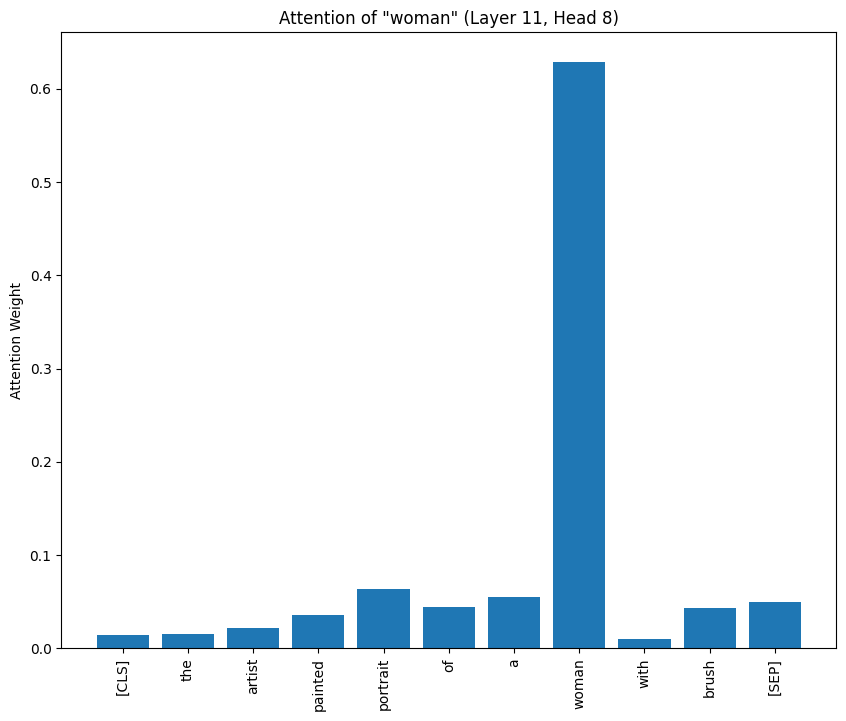

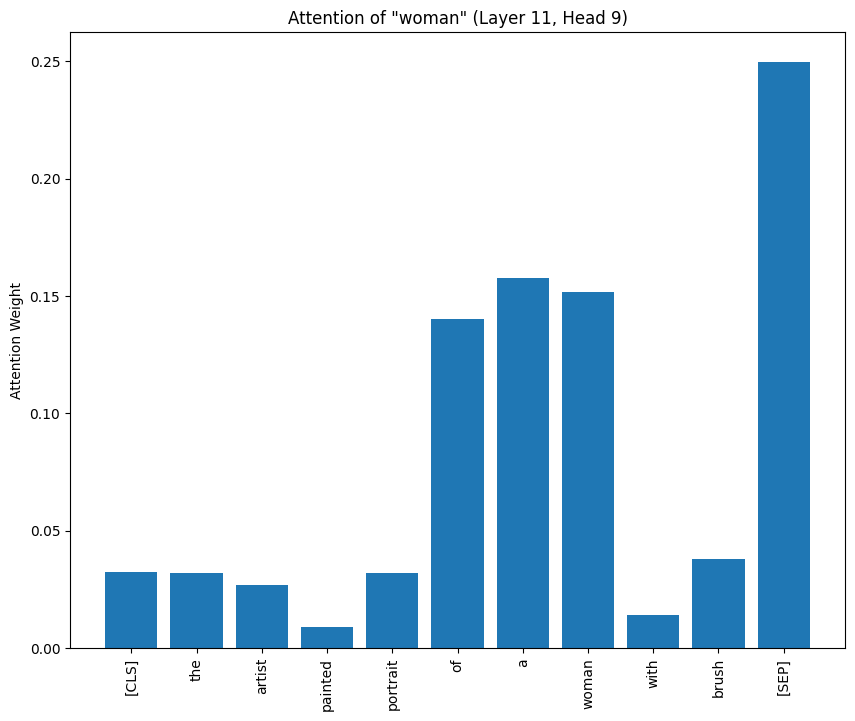

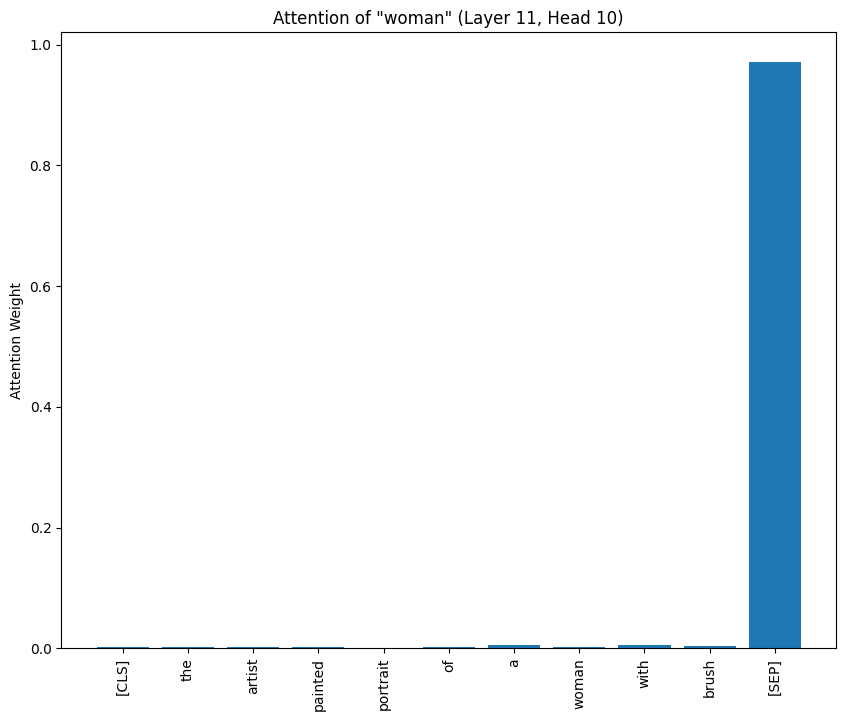

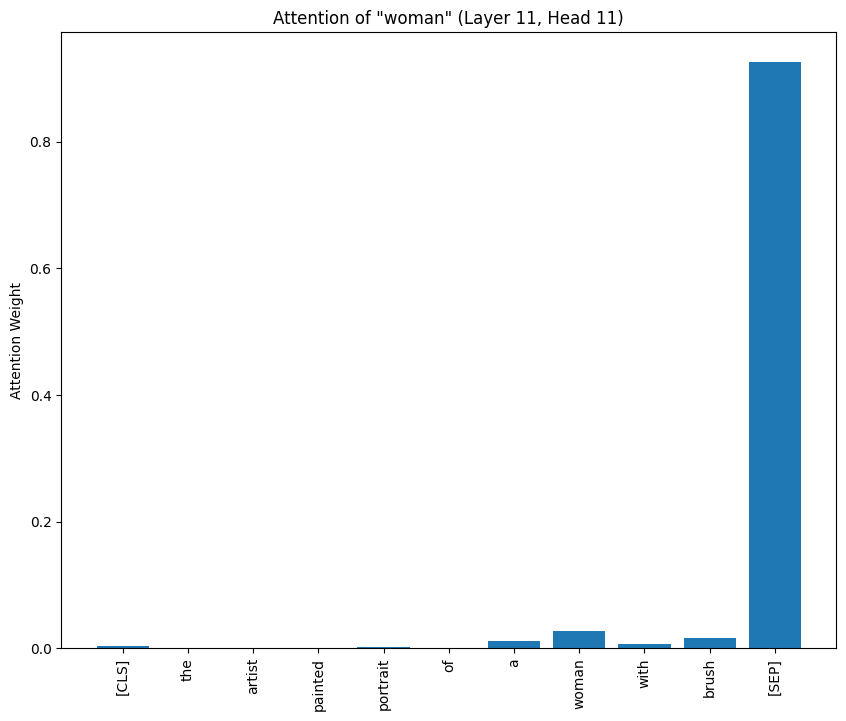

In [ ]:
import torch
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertModel
from bertviz.neuron_view import show

# Load pre-trained BERT model and tokenizer
model_name = 'bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_attentions=True)

# Example sentence
sentence = "The artist painted the portrait of a woman with a brush"

# Tokenize the input sentence
inputs = tokenizer(sentence, return_tensors='pt')
tokens = tokenizer.tokenize(sentence)
tokens = ['[CLS]'] + tokens + ['[SEP]']  # Add special tokens

# Find the index of the token "woman"
woman_index = tokens.index('woman')

# Forward pass to get outputs and attention weights
outputs = model(**inputs, output_attentions=True)
attentions = outputs.attentions  # List of attention layers (one for each layer)

# Function to visualize the attention for the token "woman"
def visualize_attention_for_woman(layer_idx, head_idx):
    # Get attention weights for the given layer and head
    attention_weights = attentions[layer_idx][0, head_idx].detach().numpy()

    # Get the attention values where "woman" is attending to other tokens
    woman_attention = attention_weights[woman_index]

    # Plot the attention map for the "woman" token
    plt.figure(figsize=(10, 8))
    plt.bar(tokens, woman_attention)
    plt.xticks(rotation=90)
    plt.ylabel('Attention Weight')
    plt.title(f'Attention of "woman" (Layer {layer_idx}, Head {head_idx})')
    plt.show()

# Iterate over all layers and heads to visualize the attention of "woman"
for layer_idx in range(len(attentions)):  # Loop through each layer
    for head_idx in range(attentions[layer_idx].size(1)):  # Loop through each head in the layer
        visualize_attention_for_woman(layer_idx, head_idx)


# Next steps

Visit the [github repository](https://github.com/jessevig/bertviz) for full documentation and additional use cases. Check out the [blog](https://towardsdatascience.com/deconstructing-bert-part-2-visualizing-the-inner-workings-of-attention-60a16d86b5c1) for a deep dive on BertViz and the attention mechanism.